In [1]:
import numpy as np
import copy
import pickle

from scipy import ndimage
from BaselineRemoval import BaselineRemoval
import matplotlib.pyplot as plt
import os
from scipy import interpolate
from scipy import signal
from scipy.fft import fft, ifft, fftfreq

plt.rcParams['figure.figsize'] = (20.0, 10.0)
# plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams['figure.dpi'] = 500
from IPython.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))

Mogelijke verbeteringen:
 - maak de covariance afhankelijke van de noise 
 - draai de spectrum zodanig dat de globale sloop de x-as is. Zodat het min-max algorithme beter werkt. DONE
 - de smoothing die applied wordt door de covariantie moet afgesteld worden per sample

Problemen:
 - initializatie maakt uit voor de kalman smoother (hoeveel noise er is vs raman)
 - aantal iteratie maakt uit voor de kalman smoother (hoeveel noise er is vs raman)
 - de bounderies hebben geen invloed op de kalman smoother buiten alles binnen de bounderies houden.
   Tenzij smoothing ook aanstaat.
   
   
excitation laser maakt uit hoe de raman laser eruit ziet. Hoger (rood) betekend lower raman signal en een breder signal

date: 2-9-2022

 - stabilise the logic part with neighbourhood information
 - where the logic part is true make the line segments bigger (does not work)
 - find something to deterime the smoothness of the poly fit (no bumbs) DONE


### Ideas:

- Wavelet transform

### Errors:

 - smooth_grad fix the try except clause such that and the beginning and end of the spectrum it also works
 - using fourier transform it seems that gibbs phenomena is a problem


In [2]:
file_location = "../data/Raman_Mouse/corrected_4_wavenumbers/"
# file_location = "../data/Green_excitation/corrected_4_wavenumbers/"

filenames = np.load(f"{file_location}FileNames.npy")
with open(f"{'/'.join(file_location.split('/')[:-2])}/Sample_labels.pickle", 'rb') as f:
    labels = pickle.load(f)
labels = {l.split(".")[0]: val for l, val in labels.items()}

wavenumbers = np.load(f"{file_location}Wavenumbers.npy")
    
data = []
for f in filenames:
    x = np.load(f"{file_location}{f.split('.')[0]}.npy")
    data.append(((x.reshape(-1,x.shape[-1])).reshape(x.shape), labels[f.split(".")[0]]))

In [3]:
# Estimators

def Roughness(photo):
    return np.sum((photo[1:] - photo[:-1])**2)
    
def SS_res(raw, photo):
    return np.sum((raw-photo)**2)

def SS_tot(raw):
    return np.sum((raw - np.sum(raw))**2)

def R2(raw, photo):
    return 1 - SS_res(raw, photo) / SS_tot(raw)

# def cov(photo, raman):
#     return (photo - np.mean(photo)) @ (raman - np.mean(raman))

def cov(photo, raman):
    return np.cov(photo, raman)

def stats(raw, photo, raman, label):
    print(f"{label} roughness {Roughness(photo)}")
    print(f"{label} roughness {R2(raw, photo)}")
    print(f"{label} covariance matrix photo raman{cov(photo, raman)}")
    print(f"{label} covariance matrix raw raman {cov(raw, raman)}")
    print(f"{label} covariance matrix raw photo {cov(raw, photo)}")
    print(f"{label} covariance matrix raw raw {cov(raw, raw)}")



In [23]:
def remove_noise_fft(x, zero=True):
    x_ = copy.copy(x)
    mean = np.mean(x)
    x_ -= mean
    fourier = fft(x_)
    xf = fftfreq(x_.shape[0], wavenumbers[1]-wavenumbers[0])
    space = range(x_.shape[0])
    index = np.argsort(xf)
    fourier_real = np.real(fourier)
    fourier_imag = np.imag(fourier)
    fourier_imag = fourier_imag[index]
    fourier_real = fourier_real[index]
    
    min_HWHM = 10
    k = (wavenumbers[-1] - wavenumbers[0]) / (2*min_HWHM)
    cut_off = int(x.shape[0] / 2 - k)
    
    left, right = cut_off, x_.shape[0]-cut_off
    smooth_fourier_imag = copy.copy(fourier_imag)
    smooth_fourier_real = copy.copy(fourier_real)

    if zero:
        smooth_fourier_real[:left] = 0
        smooth_fourier_real[right:] = 0

        smooth_fourier_imag[:left] = 0
        smooth_fourier_imag[right:] = 0
    else:
        func = interpolate.UnivariateSpline(space, fourier_real, k=4, s=5e9)
        smooth_fourier_real[:left] = func(space[:left])
        smooth_fourier_real[right:] = func(space[right:])

        func = interpolate.UnivariateSpline(space, fourier_imag, k=4, s=5e9)
        smooth_fourier_imag[:left] = func(space[:left])
        smooth_fourier_imag[right:] = func(space[right:])
    
    smooth_fourier = smooth_fourier_real[index] + 1j * smooth_fourier_imag[index]
    
    plt.plot(fourier_real, label="org real fourier")
    plt.plot(smooth_fourier_real, label="smooth real fourier")
#     plt.yscale('log')
    plt.legend()
    plt.show()

    plt.plot(fourier_imag, label="org imag fourier")
    plt.plot(smooth_fourier_imag, label="smooth imag fourier")
    plt.legend()
    plt.show()
    
    return ifft(smooth_fourier) + mean

In [24]:
def gaussian(x, mu, sigma, scale):
    x = scale * np.exp(-0.5* ((x - mu) / sigma)**2)
    return x * (x > min(scale/10, 10))

def fit_gaussian2(x, flag = False):
    min_sigma = 100
    max_sigma = 1500
    grid_size = 20
    lst = []
    
    for mu in np.concatenate((np.linspace(-1000, 0, 10), np.linspace(wavenumbers[0], wavenumbers[-1], grid_size))):
        temp_mu = 0,1,1
        temp_intergral = 0
        for sigma in np.linspace(min_sigma**0.5, max_sigma**0.5, 20)**2:
            if mu < 0 and mu + 3*sigma < 0:
                continue
                
            scale = 10
            current = gaussian(wavenumbers, mu, sigma, scale)
            
            for delta in 10**np.arange(10, -1, -1):
                while not np.sum((current - x) > 0):
                    scale += delta
                    current = gaussian(wavenumbers, mu, sigma, scale)
                else:
                    scale -= delta
                    current = gaussian(wavenumbers, mu, sigma, scale)
                    
            intergral = np.sum(current)
            if intergral > temp_intergral:
                temp_intergral = intergral
                temp_mu = mu, sigma, scale
                
        if temp_mu[1] < min_sigma: #no fit found
            continue

        for sigma in np.linspace(max(min_sigma, temp_mu[1]-50), temp_mu[1]+50, 20):
            if mu < 0 and mu + 3*sigma < 0:
                continue
            scale = 10
            current = gaussian(wavenumbers, mu, sigma, scale)
            
            for delta in 10**np.arange(10, -1, -1):
                while not np.sum((current - x) > 0):
                    scale += delta
                    current = gaussian(wavenumbers, mu, sigma, scale)
                else:
                    scale -= delta
                    current = gaussian(wavenumbers, mu, sigma, scale)
                    
            intergral = np.sum(current)
            if intergral > temp_intergral:
                temp_intergral = intergral
                temp_mu = mu, sigma, scale
        
        print(*temp_mu)
        lst.append(gaussian(wavenumbers, *temp_mu))
        if temp_mu[0] < wavenumbers[0]:
            plt.plot(gaussian(wavenumbers, *temp_mu), 'g')
        else:
            plt.plot(gaussian(wavenumbers, *temp_mu), 'b')
   
    plt.plot(x, 'r')
    plt.show()
    lst = np.array(lst)
    return np.max(lst, axis=0)

def preliminary_photo_approximation(x):
    x_ = copy.copy(x)
    gaussians = []   
    for flag in range(2):
        current = fit_gaussian2(x_, flag)
        x_ -= current
        gaussians.append(current)
    gaussians = np.array(gaussians)
    return np.sum(gaussians, axis=0)


In [25]:
rng = np.random.default_rng()
KALMAN_SMOOTHING = True
KALMAN_BOUNDARIES = True

class Kalman():    
    def __init__(self, X, grad, raman_grad, e, neighbourhood, photo_smoothness = 500, noise_smoothness = 2, correct_photo_appr_blacknoise=True):
        """
        noise_smoothness controls the amount of noise when set below zero, raman data will be seen as noise.
        high noise_smoothness means low noise (however a low number does not remove noise correctly)
        """
        
        self.X = X
        self.N_wavenumbers = self.X.shape[0]
        self.N_photo_appr = X.shape[1] - 1
        self.photo_smoothness = photo_smoothness
        self.noise_smoothness = noise_smoothness
        
        self.C = np.array([[1,1]] +
                           [[1,0]] * self.N_photo_appr)
        self.A = np.zeros((self.N_wavenumbers, 2, 2))
        self.A[:,0,0] = grad
        self.A[:,1,1] = raman_grad
#         self.A[:,1,1] = 1
        
        if correct_photo_appr_blacknoise:
            self.e = np.array([e] * X.shape[1])
        else:
            self.e = np.array([e] + [0] * self.N_photo_appr)
            
        self.n = neighbourhood
        self.mu = np.empty((self.N_wavenumbers, 2))
        self.M = np.empty((self.N_wavenumbers, 2, 2))
        self.nu = np.empty((self.N_wavenumbers+1, 2))
        self.V = np.empty((self.N_wavenumbers+1, 2, 2))
        self.J = np.empty((self.N_wavenumbers, 2, 2))

        self.nu[0] = [X[0,0], 0]
        
#         self.Sigma = np.diag(rng.standard_normal(1 + self.N_photo_appr))
#         self.Gamma = np.diag(rng.standard_normal(2))
#         self.V[0] = [[np.random.random(), 0],
#                      [0, np.random.random()]]
        self.Sigma = np.array([[5, 1], [1, 1]])
        self.Gamma = np.array([[1, 0], [0, 10]])
        self.V[0] = np.array([[1, 0], [0, 10]])
        
    @property
    def raw_data(self):
        return self.X, self.A[:,0,0]
    
    @raw_data.setter
    def raw_data(self, args):
        value, grad, raman_grad, *_ = args + [np.ones(self.X.shape)]
        self.X = value
        self.nu[0] = [self.X[0,0], 0]
        self.A[:,0,0] = grad
        self.A[:,1,1] = raman_grad
        self.EM(1)
        
    def _filter_step(self, i):
        CV = self.C @ self.V[i]
        b = self.C @ self.nu[i] + self.e
        B = CV @ self.C.T + self.Sigma
        K = self.V[i] @ self.C.T @ np.linalg.inv(B)
        self.mu[i] = self.nu[i] + K @ (self.X[i] - b)
        self.M[i] = self.V[i] - K @ CV

        # transition
        self.nu[i+1] = self.A[i] @ self.mu[i]
        self.V[i+1] = self.A[i] @ self.M[i] @ self.A[i] + self.Gamma # A = A.T
        self.b=b
        
        if KALMAN_BOUNDARIES:
            self.nu[i+1,0] = min(min(self.X[max(0,i-self.n):min(self.N_wavenumbers,i+self.n)+1,0]) - self.e[0], self.nu[i+1,0])
            self.nu[i+1,1] = max(0, self.nu[i+1,1])
        

    def _smoother_step(self, i):
        if KALMAN_BOUNDARIES:
            self.mu[i,0] = min(min(self.X[max(0,i-self.n):min(self.N_wavenumbers,i+self.n)+1,0]) - self.e[0], self.mu[i,0])
            self.mu[i,1] = max(0, self.mu[i,1])
        self.J[i] = self.M[i-1] @ self.A[i] @ np.linalg.inv(self.V[i])
        self.M[i-1] += self.J[i] @ (self.M[i] - self.V[i]) @ self.J[i].T
        self.mu[i-1] += self.J[i] @ (self.mu[i] - self.nu[i])
    
    def kalman_filter(self):
        self.tmp = []
        for i in range(len(self.X)):
            self._filter_step(i)
            self.tmp.append(self.b)
        self.tmp = np.array(self.tmp)
 
    def kalman_smoother(self):
        self.kalman_filter()
        for i in range(len(self.X)-1, -1, -1):
            self._smoother_step(i)
            
    def EM(self, n):
        for i in range(n):
            self.kalman_smoother()
            E_z = self.mu
            E_zz = self.M + self.mu.reshape(-1,self.mu.shape[1],1) @ self.mu.reshape(-1,1,self.mu.shape[1])
            E_z_1z = (self.J @ self.M)[1:] + self.mu[:-1].reshape(-1,self.mu.shape[1],1) @ self.mu[1:].reshape(-1,1,self.mu.shape[1])
            
            self.nu[0] = np.maximum(np.zeros(2), E_z[0])
            self.V[0] = self.V[2]
            
            # skip nu_0, V_0, A and C
            self.Gamma = np.sum(E_zz[1:] - 
                                E_z_1z.transpose(0,2,1) @ self.A[:-1].transpose(0,2,1) - 
                                self.A[:-1] @ E_z_1z + 
                                self.A[:-1] @ E_zz[:-1] @ self.A[:-1].transpose(0,2,1),
                                0) / self.N_wavenumbers

            self.Sigma = (self.X.T @ self.X - 
                         self.C @ E_z.T @ self.X - 
                         self.X.T @ E_z @ self.C.T + 
                         np.sum(self.C @ E_zz @ self.C.T, 0)) / (self.N_wavenumbers + 1)
                        
            # Sigma should not be a diagonal matrix
            # raw
            if KALMAN_SMOOTHING:
                self.Sigma[0,0] *= 5
                # photo
                self.Sigma[1,1] *= 1
                # cov
                new = self.Sigma[1,0] * 1
                self.Sigma[0,1], self.Sigma[1,0] = new, new
            # the covariance must be positive
            self.Sigma = np.maximum(np.ones((2,2)), self.Sigma)
#             print(self.Sigma)
            

#             make covarience diagonal          
            self.Gamma = np.diag(np.diag(self.Gamma)) 
            if KALMAN_SMOOTHING:
    #             self.Gamma[1,1] /= 10
                self.Gamma[0,0] /= 10
#             c = (self.Gamma[0,0] + self.Gamma[1,1]) / self.photo_smoothness
#             self.Gamma = np.diag([c, c*(self.photo_smoothness-1)])
            # the variance must be positive
            self.Gamma = np.maximum(np.eye(2), self.Gamma)
            
            
def split_signal(img):
    """ 
    img consists of data and label
    
    artefact due to using previous points 
    
    """
    black_noise = 0
    x = img[0].reshape(-1, img[0].shape[-1])
    #mouse image
#     n, noise_amount = 250, 3e5 
#     n, noise_amount = 85, 1e5 
    n, noise_amount = np.random.randint(x.shape[0]), 0.5e5
#     n, noise_amount = 1325, 2e5
    intervals = 10
    general_noise = 10e6
    poly_fit = 1e5
    precision = 12
    continue_gap = 100
    # green image
#     n, noise_amount = 250, 1e5
#     n, noise_amount = 85, 6e5 
#     n, noise_amount = np.random.randint(x.shape[0]), 3e5
#     general_noise = 5e6
#     intervals = 30
#     precision = 20
#     poly_fit = 8e5
#     continue_gap = 400


    print("pixel:", n)
    
    def zero_bound_to_None(bound):
        # -0 must be translate to None
        return -bound if bound != 0 else None

    def smooth_grad(poly2):
        general_grad_func = interpolate.UnivariateSpline(wavenumbers, 
                                                         poly2,
                                                         k=3, s=general_noise)
        general_grad = general_grad_func(wavenumbers)
        grad_general = general_grad[1:] - general_grad[:-1]
                
        grad = poly2[1:] - poly2[:-1]        
        grad2 = np.pad(poly2[2:] - 2 * poly2[1:-1] + poly2[:-2],(1, 0), 'edge')

        plt.plot(grad, label="grad")
        plt.plot(grad_general, label="general grad")
        
        general_max_lst = signal.argrelmax(grad_general)[0]
        max_lst = signal.argrelmax(grad)[0]
        max_grad_lst = signal.argrelmax(grad2)[0]
        min_grad_lst = signal.argrelmin(grad2)[0]
        
        for m in max_lst:
            plt.axvline(m, color='k', alpha=0.3)
#         print(max_lst)
#         print(max_grad_lst)
#         print(min_grad_lst)

        for max_ in max_lst:
            general_max = general_max_lst[np.argmin([abs(x - max_) for x in general_max_lst])]
            if abs(general_max - max_) < continue_gap/2:
#                 print("max to close", max_)
                continue
            
            try:
                *_, left = filter(lambda x: x < max_, max_grad_lst)
                right = next(filter(lambda x: x > max_, min_grad_lst))
            except (ValueError, StopIteration) as error:
#                 print("no left or right", max_)
                continue
    
            try:
                *_, left_max = filter(lambda x: x < max_, max_lst)
            except ValueError:
                left_max = 0

            try:
                right_max = next(filter(lambda x: x > max_, max_lst))
            except StopIteration:
                right_max = grad.shape[0]          
                
            old_sum = sum(grad)
            restore_grad = copy.copy(grad)
            grad[left:max_] = grad[left]
            new_sum = sum(grad)
            i = max_
                  
            dist = 3 * min(max_ - left, right - max_)
            dist = min(dist, max_ - left_max, right_max - max_)

            while True:
                while new_sum < old_sum:
                    grad[i:i+10] = grad[left]
                    new_sum = sum(grad)
                    i += 10
                    if i > min(max_ + dist, grad.shape[0]):
                        left = min(left+10, grad.shape[0]-1) #to prevent left going out of bounds
                        grad = copy.copy(restore_grad)
                        grad[left:max_] = grad[left]
                        new_sum = sum(grad)
                        i = max_
                        break
                else:
                    break
                                      
            flat_residu = (old_sum - new_sum) / (left-i)
            grad[left:i] -= flat_residu
            
            # if flatting of the maximum gradient is not possible skip
            if left >= max_:
                print("can not find smooth max", max_)
                continue
                        
            
            smooth_dist = max(2, min(i-left, continue_gap))
            sigma = smooth_dist/4
            smooth_dist2 = smooth_dist//2
            smooth_dist2b = smooth_dist - smooth_dist2
            smooth_dist3 = smooth_dist + smooth_dist2
            if left-smooth_dist3 < 0: # correct for maximums at the left part of the spectrum
                left_bound, gaus_left_bound = max(0, left-smooth_dist2), max(0, left-smooth_dist)
                grad[left_bound:i+smooth_dist2] = ndimage.gaussian_filter(grad[gaus_left_bound:i+smooth_dist], sigma, mode='nearest')[left_bound - gaus_left_bound:-smooth_dist2b]
                left_bound = max(0, left-smooth_dist)
                grad[left_bound: left+smooth_dist] = ndimage.gaussian_filter(grad[:left+smooth_dist3], sigma, mode='nearest')[left_bound:-smooth_dist2]
                left_bound, gaus_left_bound = max(0, i-smooth_dist), max(0, i-smooth_dist3)
                grad[left_bound:i+smooth_dist] = ndimage.gaussian_filter(grad[gaus_left_bound:i+smooth_dist3], sigma, mode='nearest')[left_bound - gaus_left_bound:-smooth_dist2]
            elif i + smooth_dist3 > grad.shape[0]: # correct for maximums at the right part of the spectrum
                right_bound, gaus_right_bound = max(grad.shape[0] - (i+smooth_dist2), 0), max(grad.shape[0] - (i+smooth_dist), 0)
                right_diff = right_bound - gaus_right_bound
                right_bound, gaus_right_bound, right_diff = zero_bound_to_None(right_bound), zero_bound_to_None(gaus_right_bound), zero_bound_to_None(right_diff)
                grad[left-smooth_dist2:right_bound] = ndimage.gaussian_filter(grad[left-smooth_dist:gaus_right_bound], sigma, mode='nearest')[smooth_dist2b:right_diff]
                right_bound, gaus_right_bound = max(grad.shape[0] - (left+smooth_dist), 0), max(grad.shape[0] - (left+smooth_dist3), 0)
                right_diff = right_bound - gaus_right_bound
                right_bound, gaus_right_bound, right_diff = zero_bound_to_None(right_bound), zero_bound_to_None(gaus_right_bound), zero_bound_to_None(right_diff)
                grad[left-smooth_dist:right_bound] = ndimage.gaussian_filter(grad[left-smooth_dist3:min(left+smooth_dist3, grad.shape[0])], sigma, mode='nearest')[smooth_dist2:right_diff]
                right_bound = max(grad.shape[0] - (i+smooth_dist), 0)
                right_bound = zero_bound_to_None(right_bound)
                grad[i-smooth_dist:right_bound] = ndimage.gaussian_filter(grad[i-smooth_dist3:], sigma, mode='nearest')[smooth_dist2:right_bound]
            else:
                grad[left-smooth_dist2:i+smooth_dist2] = ndimage.gaussian_filter(grad[left-smooth_dist:i+smooth_dist], sigma, mode='nearest')[smooth_dist2b:-smooth_dist2b]            
                grad[left-smooth_dist:left+smooth_dist] = ndimage.gaussian_filter(grad[left-smooth_dist3:left+smooth_dist3], sigma, mode='nearest')[smooth_dist2:-smooth_dist2]
                grad[i-smooth_dist:i+smooth_dist] = ndimage.gaussian_filter(grad[i-smooth_dist3:i+smooth_dist3], sigma, mode='nearest')[smooth_dist2:-smooth_dist2]
            
            new_sum = sum(grad)
            left_bound, right_bound = max(0,left-smooth_dist), min(i+smooth_dist, grad.shape[0])
            flat_residu = (old_sum - new_sum) / (left_bound - right_bound)
            grad[left_bound: right_bound] -= flat_residu

        plt.plot(grad, label="new grad")
        plt.legend()
        plt.show()

        plt.plot(wavenumbers, x[n], label="raw")
        plt.plot(wavenumbers, poly2, label="poly")

        value = poly2[0]
        poly2 = [value]
        for g in grad:
            value += g
            poly2.append(value)
        poly2 = np.array(poly2)
        
        plt.plot(wavenumbers, poly2, label="poly new")
        plt.legend()
        plt.show()
        
        return poly2
    
    """********************************************************************"""
    def poly_approximation(general, iteration, logic=None, weighted=False):
        if logic is None:
            general_grad_func = interpolate.UnivariateSpline(wavenumbers, 
                                                             general,
                                                             k=4, s=general_noise*5)
            general_grad = general_grad_func(wavenumbers)
            sec_grad2 = np.pad(general_grad[2:] - 2*general_grad[1:-1] + general_grad[:-2], (1, 1), 'edge')
            grad = np.pad(general[1:] - general[:-1], (0,1), 'edge')
            grad_m = np.mean(np.abs(grad))
            small_grad = np.abs(grad) < grad_m
            sec_grad_pos = (sec_grad2 < 0)
            
#             if iteration == 9:
#                 plt.plot(x[n],label="raw")
#                 plt.plot(general,label="poly")
#                 plt.plot(general_grad,label="general grad")
#                 plt.plot(small_grad*500-1400, alpha=0.7, label="gradient smaller than average")
#                 plt.plot(sec_grad_pos*500-1400, alpha=0.7, label="second gradient smaller than zero")

            small_grad = ndimage.minimum_filter(small_grad, size=continue_gap)
            sec_grad_pos = ndimage.minimum_filter(sec_grad_pos, size=continue_gap)
            small_grad = ndimage.maximum_filter(small_grad, size=continue_gap)
            sec_grad_pos = ndimage.maximum_filter(sec_grad_pos, size=continue_gap)
            logic = sec_grad_pos * small_grad
#             if iteration == 9:
#                 plt.plot(small_grad*500-700, alpha=0.7, label=f"gradient smaller than average for at least {continue_gap} values")
#                 plt.plot(sec_grad_pos*500-700, alpha=0.7, label=f"gradient smaller than average for at least {continue_gap} values")
#                 plt.legend()
#                 plt.show()
        sec_grad_sign = ndimage.gaussian_filter(logic.astype(np.float32), 50)       
        
#         if iteration == 9:
#             plt.title("general slope")
#             plt.plot(x[n],label="raw")
#             plt.plot(general, label="smooth function")
#             try:
#                 plt.plot((sec_grad_pos)*500-700, label="second gradient smaller than zero")
#                 plt.plot(small_grad * 500-700, label="gradient smaller than average")
#             except UnboundLocalError:
#                 pass
#             plt.plot(sec_grad_sign*500, label="logic when to use minimum with smooth transition")
#             plt.legend()
#             plt.show()

        minimums = []
        step = x[n].shape[0]//intervals
        for j in range(0, step, step//precision):
            x_ = copy.copy(x[n])
            # to adress exponential values at the left side of the spectrum, make these value higher
            if j > 0:
                new_step = x_[:j].shape[0]
                slope = general[:j]
                height = slope[-1] - slope[0]
                slope = np.linspace(0, height, new_step)
                index = np.argmin(x_[:j] - slope)
                slope -= slope[index]
                slope += x[n, index]
                x_[:j] = slope
            
            for i in range(j, x[n].shape[0]-1, step):
                step_size = step
                new_step = x_[i:i+step_size].shape[0]
                smooth_curve = general[i:i+new_step]
                height = smooth_curve[-1] - smooth_curve[0]
                slope = np.linspace(0, height, new_step)
                index = np.argmin(x_[i:i+new_step] - slope)
                slope -= slope[index]
                slope += x[n, i+index]
                x_[i:i+new_step] = slope
#             x_[:3] = copy.copy(x[n,:3])
            minimums.append(x_)
                  
#             if iteration == 9:
#                 plt.plot(x_)
# #                 plt.plot(x_, label="Tangent of the smooth function fit to the raw data")

#         if iteration == 9:
#             plt.title("Tagent Min-max algorithm")
#             plt.plot(general,label="current smooth function")
#             plt.plot(x[n], label="raw")
#             plt.legend()
#             plt.show()

        poly_max = np.max(np.array(minimums), axis=0)
        poly_min = np.min(np.array(minimums), axis=0)
        poly = sec_grad_sign * poly_min + (1-sec_grad_sign) * poly_max
        
#         if iteration == 9:
#             plt.plot(poly_max,label="maximum of all tangents")
#             plt.plot(poly_min,label="minimum of all tangents")
#             plt.plot(x[n], label="raw")
#             plt.legend()
#             plt.show()  
            
#             plt.plot(poly,label="Out come of Tangent min-max algorithm")
#             plt.plot(x[n], label="raw")
#             plt.legend()
#             plt.show()  

        if not weighted:
            func = interpolate.UnivariateSpline(wavenumbers, 
                                                poly,
                                                k=4, s=poly_fit)
            poly2 = func(wavenumbers)
            poly2 = smooth_grad(poly2)
            
        else:
            old_poly = poly-1
            j = 0
            while sum(poly-old_poly) and j < 5:
                j += 1
                func = interpolate.UnivariateSpline(wavenumbers, 
                                                    poly,
                                                    k=4, s=poly_fit)
                poly2 = func(wavenumbers)

#                 if iteration == 9:
#                     plt.title("Min-max approximation of photo")
#                     plt.plot(wavenumbers, x[n], label="raw")
#                     plt.plot(wavenumbers, poly, label="photo approx")
#                     plt.plot(wavenumbers, poly2, label="poly")
#                     plt.plot(wavenumbers, (poly2 > x[n]) *500, alpha=0.3, label="poly to high")
                old_poly = copy.copy(poly)

                """
                This pushes the poly graph down acting like a weight for the spline to fit the graph below x[n]
                """
                problem_part = ndimage.maximum_filter(ndimage.minimum_filter(poly2 > x[n], 3), continue_gap//5)
                poly -= problem_part * 5
#                 if iteration == 9:
#                     plt.plot(wavenumbers, problem_part*500, label="problem")
#                     plt.legend()
#                     plt.show()
            poly2 = smooth_grad(poly2)
            

        if iteration == 9:
            plt.title("Min-max approximation of photo")
            plt.plot(wavenumbers, x[n], label="raw")
            plt.plot(wavenumbers, poly, label="tangent fit")
            plt.plot(wavenumbers, poly2, label="smoothed tangent fit")
            plt.legend()
            plt.show()

        return poly2, logic

    """********************************************************************"""

#     correction_func = interpolate.UnivariateSpline(wavenumbers, 
#                                                    x[n],
#                                                    k=4, s=general_noise)
#     general = correction_func(wavenumbers)
#     poly2, logic = poly_approximation(general,9, weighted=True)
    poly = preliminary_photo_approximation(x[n])
    poly2 = smooth_grad(poly)
    
    plt.title("gaussian fit")
    plt.plot(wavenumbers, poly, label="gaussian fit")
    plt.plot(wavenumbers, poly2, label="smooth gaussian fit")
    plt.plot(wavenumbers, x[n], label="raw")
    plt.title("gaussian fit")
    plt.legend()
    plt.show()
    for i in range(2):
        poly2, logic = poly_approximation(poly2, 9, weighted=True)

            
    grad = np.pad(poly2[1:] / poly2[:-1],(0, 1), 'edge')
                   
#     raman = np.maximum(np.zeros(x[n].shape), x[n]-poly2) # make sure that all numbers are positive
#     func = interpolate.UnivariateSpline(wavenumbers, 
#                                         raman,
#                                         k=4, s=noise_amount) #tweaked per sample [1e5, 6e5]
#     raman2 = np.maximum(np.ones(x[n].shape), func(wavenumbers)) # make sure that x_n / x_n-1 < 0
    
#     remove_noise_fft(x[n], zero=False)
#     remove_noise_fft(poly, zero=False)
    raman = remove_noise_fft(x[n] - poly, zero=False) 
#     raman = remove_noise_fft(x[n]-poly)
    raman2 = np.maximum(np.ones(x[n].shape), raman) # make sure that x_n / x_n-1 < 0

    plt.title("approximate raman based on photo (this is includes noise)")
    plt.plot(x[n]-poly, label="raman + noise")
    plt.plot(raman, label="approx raman")
    plt.plot(raman2, label="raman poly")
#     plt.plot(raman3, label="raman smooth first")
    plt.legend()
    plt.show()
       
    raman_grad = np.pad(raman2[1:] / raman2[:-1],(0, 1), 'edge')
    raman_grad = np.maximum(np.zeros(x[n].shape)+0.1, raman_grad)
    raman_grad = np.minimum(np.zeros(x[n].shape)+10, raman_grad)

    plt.title("the gradient of the approximate raman")
    plt.plot(raman_grad, label="raman poly grad")
    plt.legend()
    plt.show()   
    
    stats(x[n], poly2, raman2, "approximation")
    
    plt.title("all approximations")
    plt.plot(x[n], label="raw")
    plt.plot(poly2, label="poly")
    plt.plot(raman2, label='raman')
#     plt.ylim([-50, 4500])
    plt.legend()
    plt.show()
    
    obj = Kalman(np.stack((x[n], poly2)).T, grad, raman_grad, black_noise, neighbourhood=1, photo_smoothness=5000, noise_smoothness=1)
    obj.EM(10)
    
    plt.title("innerworkings of kalman filter")
    plt.plot(x[n], label="raw")
    plt.plot(obj.tmp[:,0], label="new raw", alpha=0.7)
    plt.legend()
    plt.show()

    plt.title("innerworkings of kalman filter")
    plt.plot(poly2, label="poly")
    plt.plot(obj.tmp[:,1], label="new poly", alpha=0.7)
    plt.legend()
    plt.show()
    
    stats(x[n], obj.mu[:,0], obj.mu[:,1], "kalman")
    
    plt.title("kalman filter results")
    plt.plot(wavenumbers,x[n], label="raw")
    plt.plot(wavenumbers,obj.mu[:,0], label="photo")
    plt.plot(wavenumbers,obj.mu[:,1], label="raman")
    plt.plot(wavenumbers,x[n] - obj.mu[:,0] - obj.mu[:,1], label="noise", alpha=0.5)
    
    import scipy.stats as stats2
    print("pearson poly raman" ,stats2.pearsonr(obj.mu[:,1], obj.mu[:,0]))
    print("pearson poly raw" ,stats2.pearsonr(obj.mu[:,0], x[n]))
    print("pearson raman raw" ,stats2.pearsonr(obj.mu[:,1], x[n]))

#     plt.ylim([-50, 4500])
    plt.legend()
    plt.show()
    
    from BaselineRemoval import BaselineRemoval

    baseObj = BaselineRemoval(x[n])
    Zhangfit_output = baseObj.ZhangFit(lambda_=100)
    poly2 = x[n] - Zhangfit_output
   
    stats(x[n], poly2, Zhangfit_output, "Zhang fit")
    print("pearson poly raman" ,stats2.pearsonr(poly2, Zhangfit_output))
    print("pearson poly raw" ,stats2.pearsonr(poly2, x[n]))
    print("pearson raman raw" ,stats2.pearsonr(Zhangfit_output, x[n]))

    plt.title("Zhangfit results")
    plt.plot(wavenumbers,x[n], label="raw")
    plt.plot(wavenumbers, poly2, label="photo")
    plt.plot(wavenumbers, Zhangfit_output, label="raman")
#     plt.ylim([-50, 4500])
    plt.legend()
    plt.show()

    return
    
    raman = np.empty(x.shape)
    photo = np.empty(x.shape)
    
    for pixel in range(x.shape[0]):
        baseObj = BaselineRemoval(x[pixel])

#         Modpoly_output = baseObj.ModPoly(4)
        Zhangfit_output = baseObj.ZhangFit()

#         poly = x[pixel] - Modpoly_output
#         grad = ndimage.gaussian_filter(np.pad(poly[1:] / poly[:-1],(0, 1), 'edge'), 50)

        poly2 = x[pixel] - Zhangfit_output
        grad2 = ndimage.gaussian_filter(np.pad(poly2[1:] / poly2[:-1],(0, 1), 'edge'), 50)
    
        smooth_grad = ndimage.gaussian_filter(np.pad(poly2[1:] - poly2[:-1],(0, 1), 'edge'), 50)
        mask = np.abs(smooth_grad) > 0.1
        grad3 = grad2 * mask + (1-mask) * np.ones(grad2.shape)
        grad4 = ndimage.gaussian_filter(grad3, 100)

        smooth_poly = ndimage.gaussian_filter(poly2, 50)
    
        obj.raw_data = np.stack((x[pixel], smooth_poly)).T, grad4
        
        raman[pixel] = obj.mu[:,1]
        photo[pixel] = obj.mu[:,0]
        
    return raman, photo

pixel: 2751
-1000.0 1544.7368421052631 2318
-888.8888888888889 1507.8947368421052 2212
-777.7777777777778 1435.159944726722 2151
-666.6666666666666 1424.6336289372482 2021
-555.5555555555555 1387.7915236740903 1927
-444.44444444444446 1324.8927610919952 1859
-333.33333333333326 1298.576971618311 1765
-222.22222222222217 1256.4717084604163 1690
-111.11111111111109 1208.6721333063467 1623
0.0 1161.3037122537153 1562
95.0 1118.0770087381968 1514
197.55263157894737 1070.7085876855651 1467
300.10526315789474 1021.5284400191242 1427
402.6578947368421 968.8968610717558 1395
505.2105263157895 913.7632692543924 1373
607.7631578947369 842.1499174966332 1366
710.3157894736842 789.5183385492647 1379
812.8684210526316 722.4778584300569 1418
915.421052631579 670.536565738874 1356
1017.9736842105264 617.9049867915055 1306
1120.5263157894738 560.0102499494002 1236
1223.078947368421 501.4252268511095 1142
1325.6315789473683 488.2673321142674 970
1428.1842105263158 442.1499174966333 871
1530.73684210526

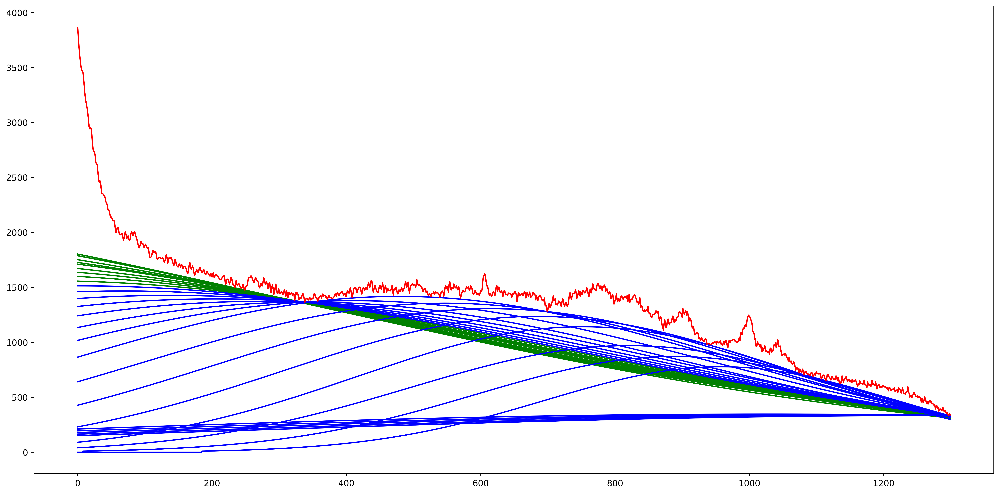

-1000.0 334.8159008333399 111910
-888.8888888888889 300.4758084401768 146751
-777.7777777777778 263.6337031770189 197218
-666.6666666666666 223.34016663293352 355023
-555.5555555555555 187.61950172739947 586161
-444.44444444444446 156.47170846041672 762577
-333.33333333333326 139.0923837902202 229547
-222.22222222222217 121.71799099456678 59592
-111.11111111111109 102.63157894736842 14725
0.0 100.0 1359
95.0 100.0 360
197.55263157894737 100.0 102
812.8684210526316 107.89473684210526 1
915.421052631579 107.89473684210526 3
1325.6315789473683 121.05263157894737 1


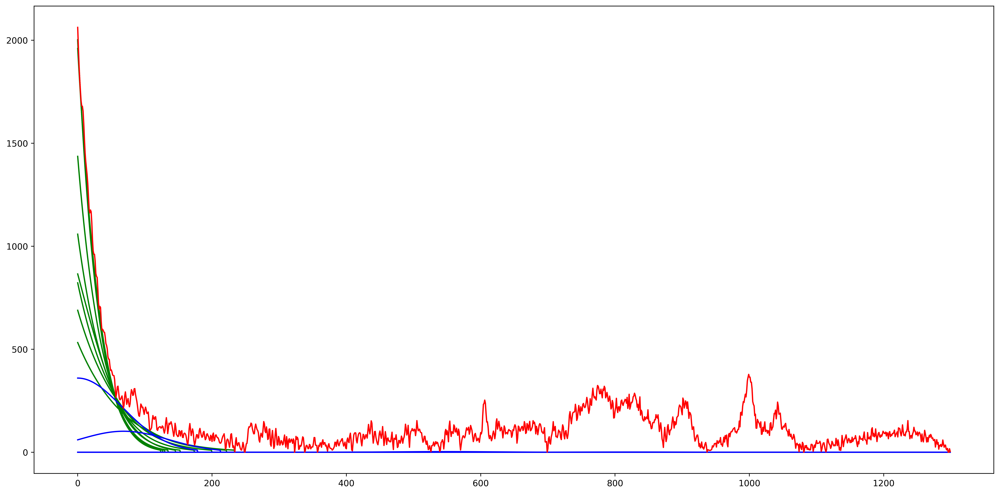

can not find smooth max 132
can not find smooth max 333
can not find smooth max 354


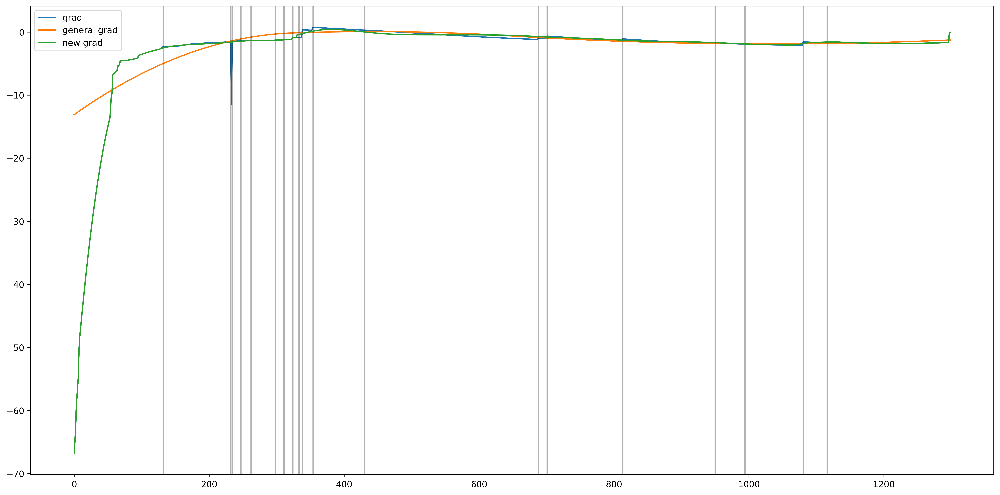

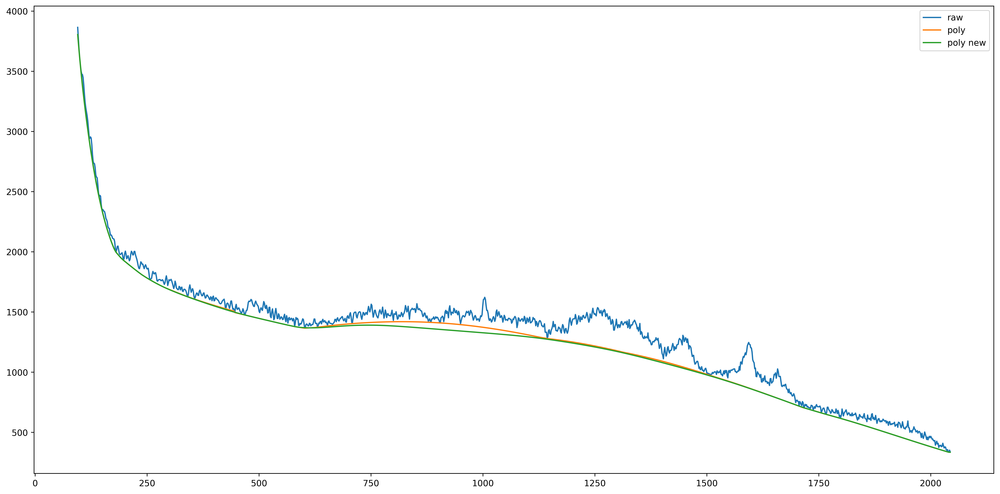

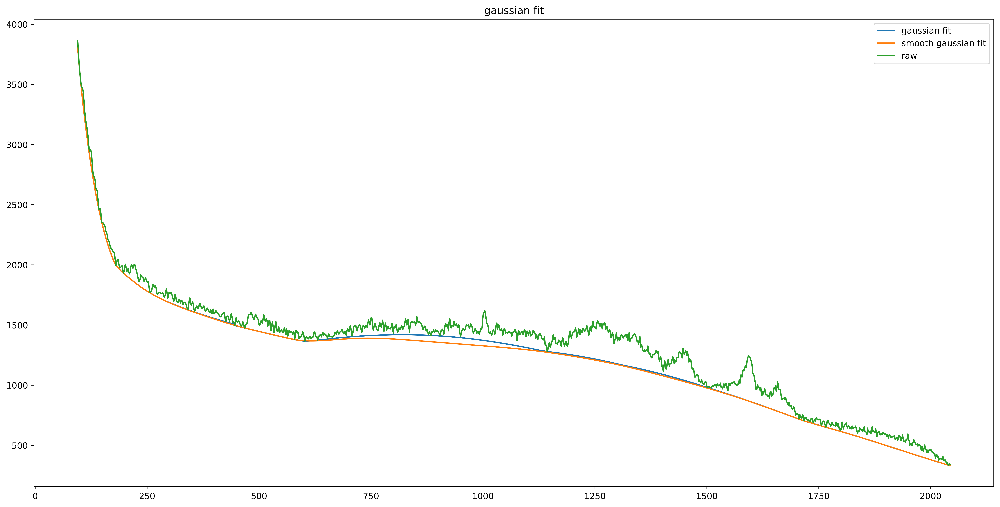

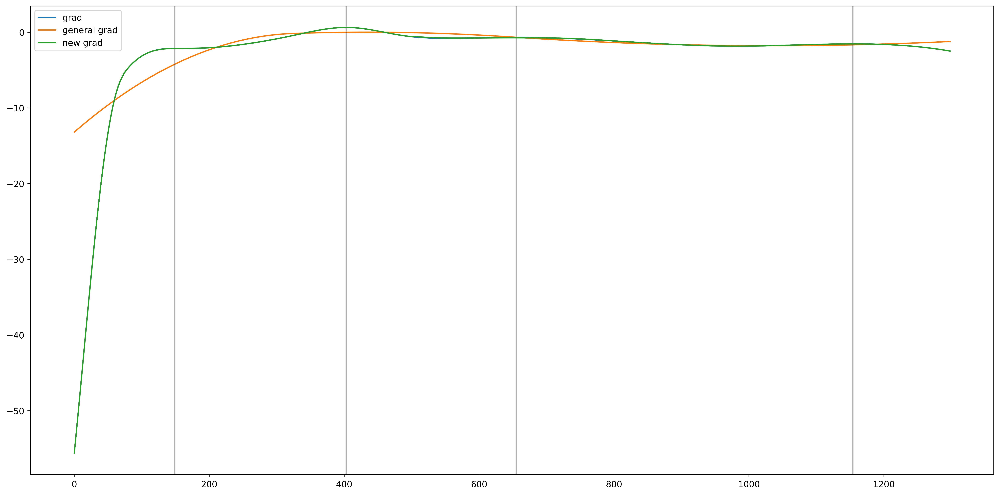

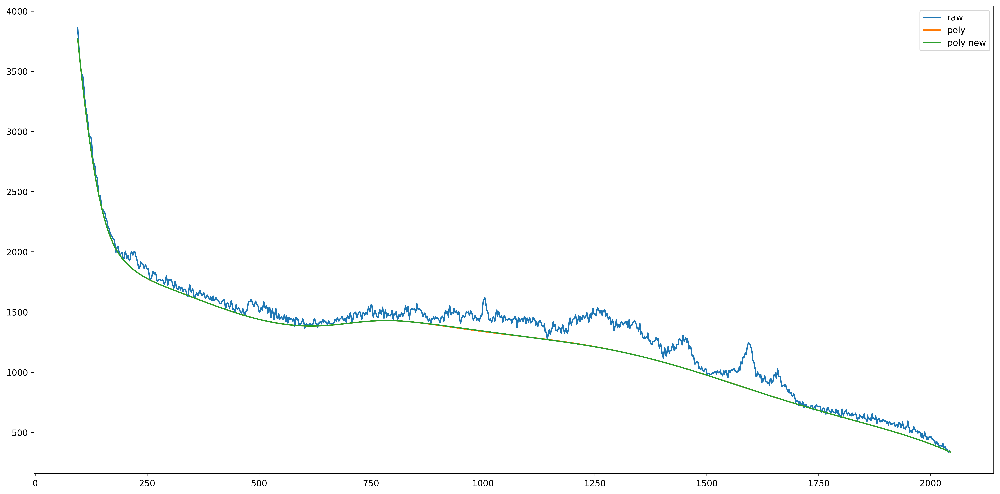

...

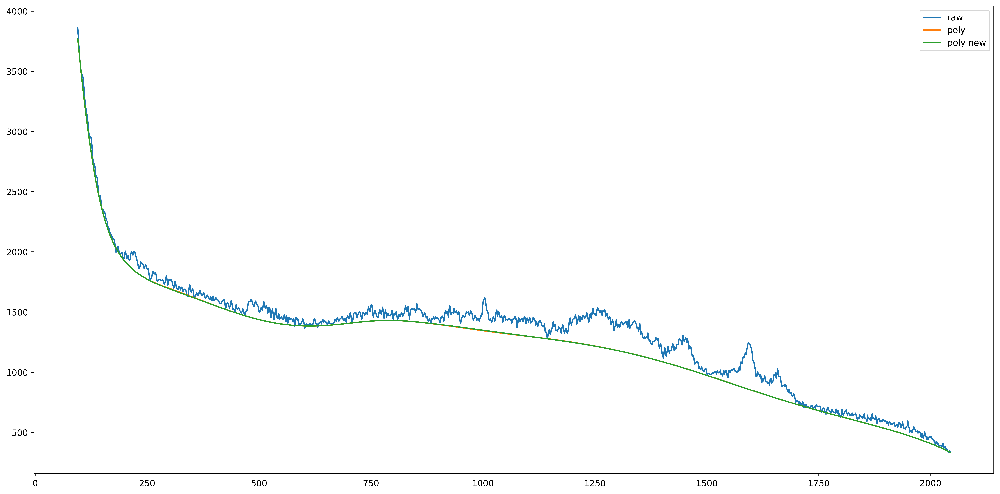

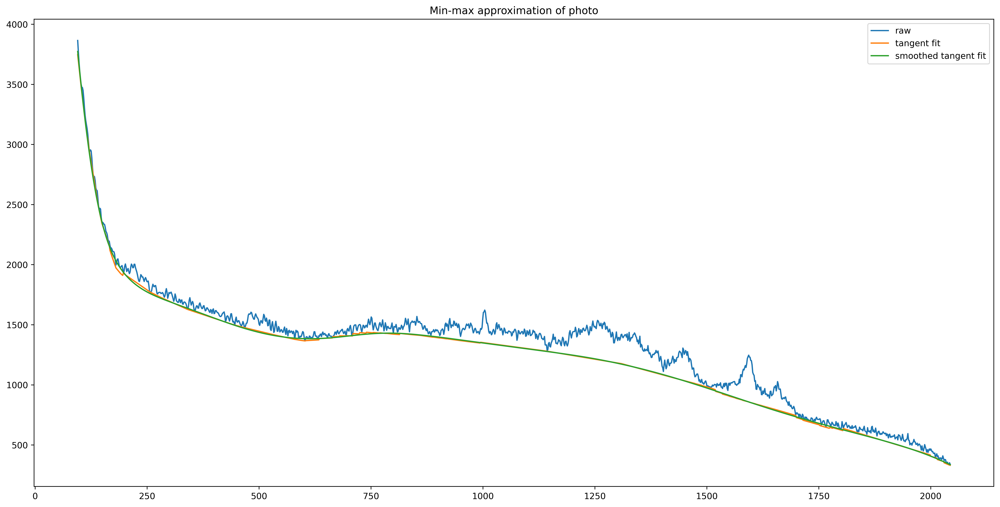

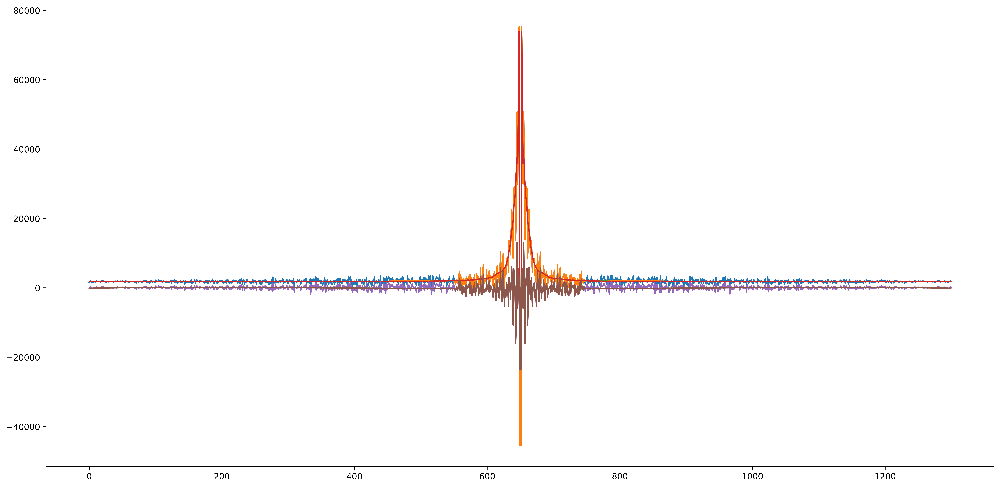

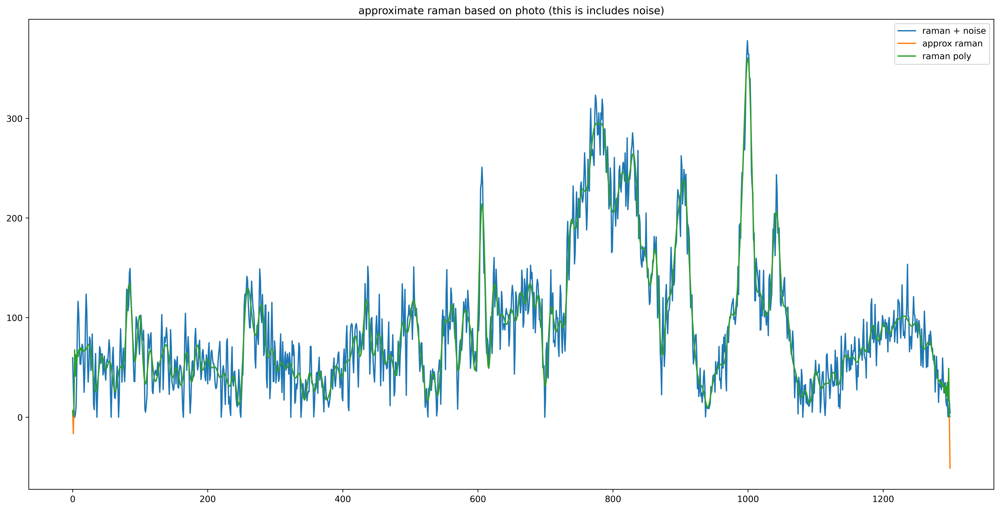

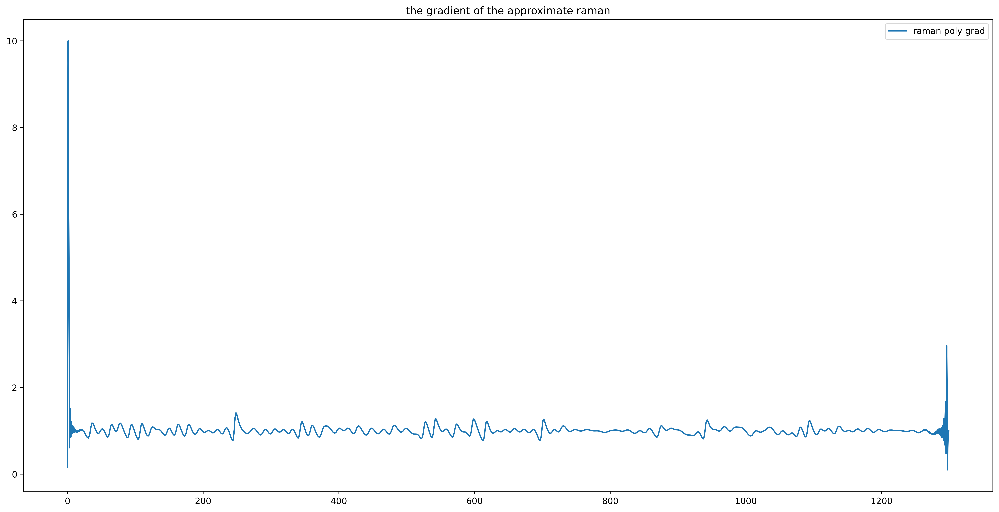

approximation roughness 68982.61262323096
approximation roughness 0.9999999955429779
approximation covariance matrix photo raman[[247093.65632115+0.j          -4722.99780454-2.88516433j]
 [ -4722.99780454+2.88516433j   4263.77693336+0.j        ]]
approximation covariance matrix raw raman [[246815.85704664+0.j           -253.58058223-2.88939475j]
 [  -253.58058223+2.88939475j   4263.77693336+0.j        ]]
approximation covariance matrix raw photo [[246815.85704664 244336.86761625]
 [244336.86761625 247093.65632115]]
approximation covariance matrix raw raw [[246815.85704664 246815.85704664]
 [246815.85704664 246815.85704664]]


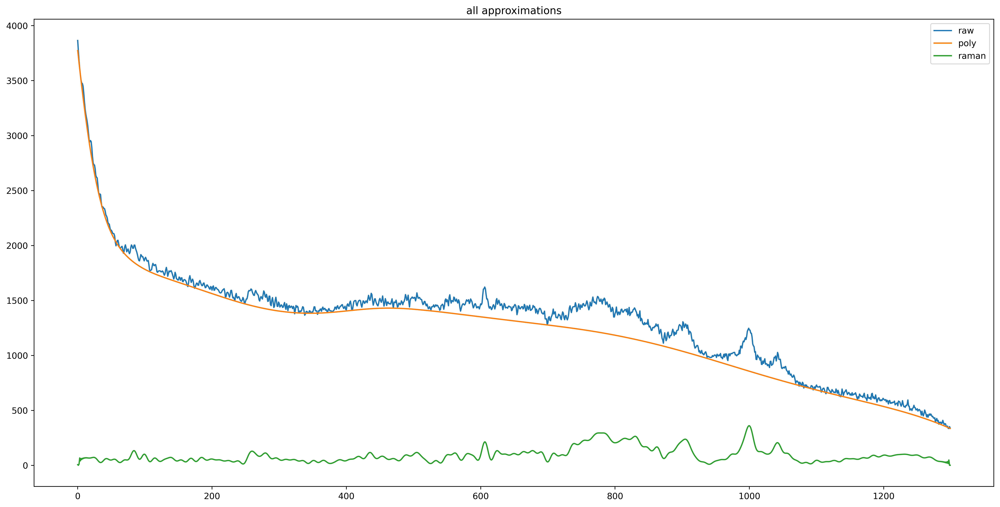

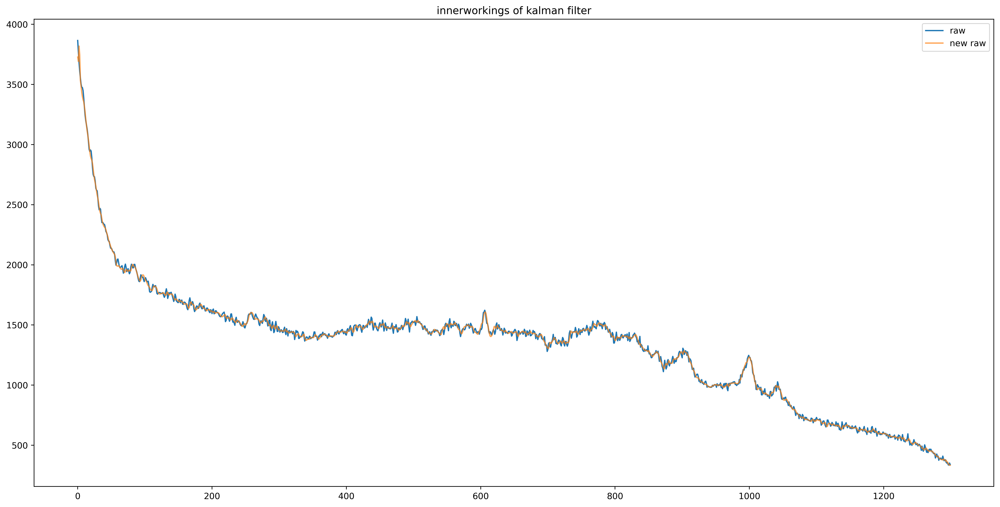

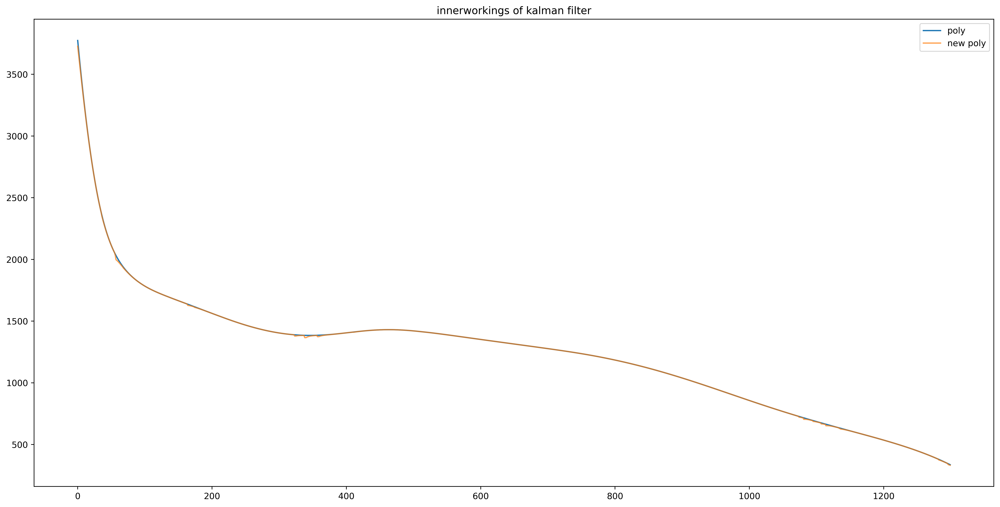

kalman roughness 68209.11034159892
kalman roughness 0.9999999955033866
kalman covariance matrix photo raman[[245086.91400609  -2880.18975777]
 [ -2880.18975777   4913.05768957]]
kalman covariance matrix raw raman [[246815.85704664   1956.48411349]
 [  1956.48411349   4913.05768957]]
kalman covariance matrix raw photo [[246815.85704664 243425.01933589]
 [243425.01933589 245086.91400609]]
kalman covariance matrix raw raw [[246815.85704664 246815.85704664]
 [246815.85704664 246815.85704664]]
pearson poly raman (-0.08300134081483573, 0.0027449341234232006)
pearson poly raw (0.9897343023651473, 0.0)
pearson raman raw (0.056184156469636745, 0.042826325515912714)


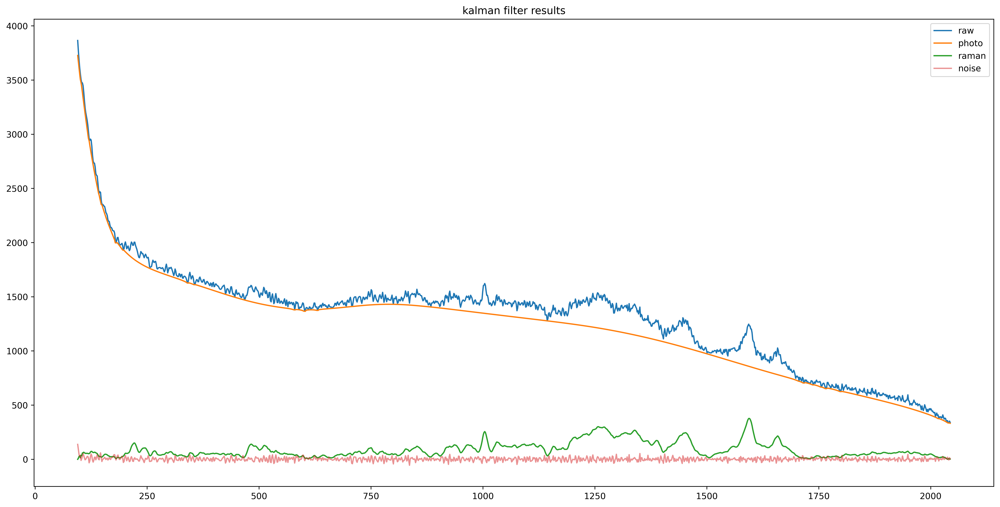

Zhang fit roughness 11492.138480066935
Zhang fit roughness 0.9999999939749864
Zhang fit covariance matrix photo raman[[209486.73427201  12786.05042183]
 [ 12786.05042183  11757.02193097]]
Zhang fit covariance matrix raw raman [[246815.85704664  24543.0723528 ]
 [ 24543.0723528   11757.02193097]]
Zhang fit covariance matrix raw photo [[246815.85704664 222272.78469384]
 [222272.78469384 209486.73427201]]
Zhang fit covariance matrix raw raw [[246815.85704664 246815.85704664]
 [246815.85704664 246815.85704664]]
pearson poly raman (0.2576377426480167, 3.723058042428235e-21)
pearson poly raw (0.9775106509554674, 0.0)
pearson raman raw (0.455610510679342, 1.2796722010132927e-67)


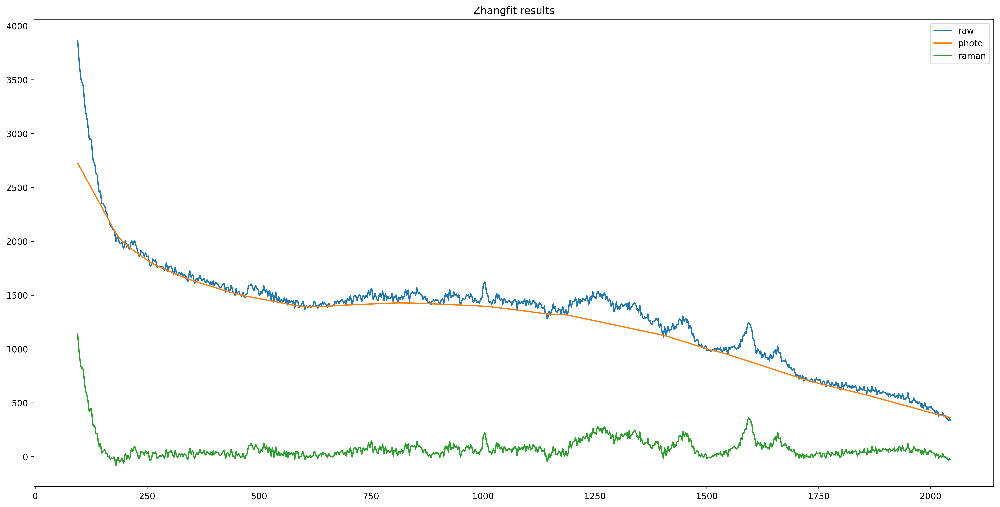

TypeError: cannot unpack non-iterable NoneType object

In [26]:
import timeit
from os import path

file_location2 = f"{'/'.join(file_location.split('/')[:-2])}/approximated/"
os.makedirs(file_location2, exist_ok=True)

shape = data[0][0].shape

for j, (f, img) in enumerate(zip(filenames, data)):   
    start = timeit.default_timer()
#     if path.exists(f'{file_location2}{f.split("/")[-1].split(".")[0]}_raman.npy'):
#         print(f'file already exist {file_location2}{f.split("/")[-1].split(".")[0]}_raman')
#         continue

#     if j < 7:
#         continue
    
    raman, photo = split_signal(img)

    stop = timeit.default_timer()
    print('Time: ', stop - start)  

    np.save(f'{file_location2}{f.split("/")[-1].split(".")[0]}_raman', raman.reshape(shape))
    np.save(f'{file_location2}{f.split("/")[-1].split(".")[0]}_photoluminescence', photo.reshape(shape))
    print(f"image: {f} is done.")